# Mapas: Machine Learning

Por: [Eduardo Graells-Garrido](http://datagramas.cl) (`egraells@udd.cl`).


In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ésta es una biblioteca ad-hoc que estamos construyendo con Diego Caro
import carpynter

# Esto configura la apariencia de los gráficos utilizando configuraciones de seaborn
sns.set(context='poster', style='ticks', palette='inferno', font='Linux Biolinum O')

# Esto es una instrucción de Jupyter que hace que los gráficos se desplieguen en el notebook
%matplotlib inline

In [2]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 150

In [16]:
from shapely.geometry import Point

def to_point(row):
    return Point(row.destination_longitude, row.destination_latitude)

urban_areas = gpd.read_file('./input/urban_areas/', crs={'init': 'epsg:5361'})
urban_areas_ll = urban_areas.to_crs({'init': 'epsg:4326'})
municipalities = gpd.read_file('./input/shapefile_comunas/', crs={'init': 'epsg:5361'})
stgo_municipalities = gpd.sjoin(municipalities, urban_areas[urban_areas.NOMBRE == 'Santiago'], 
                                op='intersects')
stgo = urban_areas[urban_areas.NOMBRE == 'Santiago'].geometry.values[0]

def intersection(municipality, urban_area):
    return municipality.intersection(urban_area)

def urban_part(municipality):
    return intersection(municipality, stgo)

stgo_urban_municipalities = (stgo_municipalities.copy()
                             .assign(geometry=lambda df_: df_['geometry'].map(urban_part))
                             .pipe(lambda x: x[~x.NOM_COM.isin(['Lampa', 'Colina'])]))

trips = pd.read_csv('./intermediate/stgo-travel-survey-2012.csv.gz')
trips['departure_time'] = pd.to_timedelta(trips.HoraIni)

zones = (gpd.read_file('./input/2012_eod_stgo/Zonificacion_EOD2012/', crs={'init': 'epsg:5361'}).set_index('ID'))
urban_zones = (zones.copy()
               .assign(geometry=lambda df_: df_.geometry.buffer(0).map(urban_part))
               .pipe(lambda df_: df_[~df_.is_empty].copy())
               .to_crs({'init': 'epsg:4326'}))

## Zone Clustering using Non-Negative Matrix Factorization

  * [Non-Negative Matrix Factorization](https://en.wikipedia.org/wiki/Non-negative_matrix_factorization)


![](http://www.momo.cs.okayama-u.ac.jp/~takahashi/nmf.png)!

In [5]:
from sklearn.decomposition import NMF

In [8]:
zone_modal = (trips[(trips['Proposito'].isin(['Al trabajo']))
                   & (trips['departure_time'] >= pd.Timedelta(hours=6, minutes=0))
                   & (trips['departure_time'] <= pd.Timedelta(hours=9, minutes=30))]
                    .groupby(['Zona', 'ModoDifusion'])
                    .aggregate({'FactorLaboralNormal': 'sum'})
                    .reset_index()
                    .pivot(index='Zona', columns='ModoDifusion', values='FactorLaboralNormal')
                    .fillna(0)
                    .pipe(lambda x: x.div(x.sum(axis=1), axis=0))
                   )
zone_modal.sample(5)

ModoDifusion,Auto,Bicicleta,Bip!,Bip! - Otros Privado,Bip! - Otros Público,Caminata,Otros,Taxi,Taxi Colectivo
Zona,,,,,,,,,
436,0.855243,0.000000,0.112193,0.0,0.032564,0.000000,0.0,0.0,0.0
86,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
200,0.428669,0.000000,0.571331,0.0,0.000000,0.000000,0.0,0.0,0.0
516,0.632329,0.367671,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0
33,0.091600,0.041107,0.309193,0.0,0.040508,0.517592,0.0,0.0,0.0


In [9]:
zone_purposes_w = (trips.groupby(['Zona', 'Proposito'])
                    .aggregate({'FactorSabadoNormal': 'sum', 
                                'FactorDomingoNormal': 'sum'})
                    .assign(viajes=lambda x: x.sum(axis=1))
                    .drop(['FactorSabadoNormal', 'FactorDomingoNormal'], axis=1)
                    .reset_index()
                    .pivot(index='Zona', columns='Proposito', values='viajes')
                    .fillna(0)
                    .pipe(lambda x: x.div(x.sum(axis=1), axis=0))
                    .fillna(0)
                   )
zone_purposes_w.sample(5)

Proposito,Al estudio,Al trabajo,Buscar o Dejar a alguien,Buscar o dejar algo,Comer o Tomar algo,De compras,De salud,Otra actividad (especifique),Por estudio,Por trabajo,Recreación,Trámites,Visitar a alguien,volver a casa
Zona,,,,,,,,,,,,,,
375,0.0,0.281998,0.0,0.0,0.0,0.0,0.0,0.0,0.230226,0.000000,0.0,0.0,0.00000,0.487776
265,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.5,0.00000,0.500000
580,0.0,0.291600,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.111185,0.0,0.0,0.14406,0.453155
607,0.0,0.470097,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.00000,0.529903
445,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.00000,0.000000


In [10]:
zone_purposes = (trips.groupby(['Zona', 'Proposito'])
                    .aggregate({'FactorLaboralNormal': 'sum'})
                    .assign(viajes=lambda x: x.sum(axis=1))
                    .drop(['FactorLaboralNormal'], axis=1)
                    .reset_index()
                    .pivot(index='Zona', columns='Proposito', values='viajes')
                    .fillna(0)
                    .pipe(lambda x: x.div(x.sum(axis=1), axis=0))
                    .fillna(0)
                   )
zone_purposes.sample(5)

Proposito,Al estudio,Al trabajo,Buscar o Dejar a alguien,Buscar o dejar algo,Comer o Tomar algo,De compras,De salud,Otra actividad (especifique),Por estudio,Por trabajo,Recreación,Trámites,Visitar a alguien,volver a casa
Zona,,,,,,,,,,,,,,
473,0.141569,0.226218,0.013388,0.000000,0.000000,0.052809,0.012389,0.000000,0.000000,0.000000,0.000000,0.042868,0.000000,0.510759
454,0.070848,0.189968,0.000000,0.000000,0.000000,0.049629,0.048890,0.000000,0.043963,0.014156,0.028312,0.070273,0.000000,0.483961
312,0.076798,0.165273,0.065908,0.007522,0.009817,0.060453,0.019635,0.021946,0.003789,0.028332,0.014726,0.034916,0.057093,0.433792
720,0.133652,0.000000,0.000000,0.000000,0.000000,0.133652,0.198087,0.000000,0.000000,0.000000,0.000000,0.133652,0.000000,0.400957
167,0.117785,0.175401,0.117124,0.000000,0.000000,0.058096,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.531594


In [11]:
zone_data = zone_modal.join(zone_purposes).join(zone_purposes_w, rsuffix='r_').fillna(0)
zone_data.sample(5)

,Auto,Bicicleta,Bip!,Bip! - Otros Privado,Bip! - Otros Público,Caminata,Otros,Taxi,Taxi Colectivo,Al estudio,...,Comer o Tomar algor_,De comprasr_,De saludr_,Otra actividad (especifique)r_,Por estudior_,Por trabajor_,Recreaciónr_,Trámitesr_,Visitar a alguienr_,volver a casar_
Zona,,,,,,,,,,,,,,,,,,,,,
582,0.087765,0.066667,0.472808,0.000000,0.000000,0.372760,0.000000,0.0,0.000000,0.078354,...,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.564399,0.435601
162,0.213102,0.116849,0.334201,0.000000,0.000000,0.116849,0.102151,0.0,0.116849,0.125641,...,0.0,0.362840,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.485247
267,0.761144,0.000000,0.238856,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.044491,...,0.0,0.147514,0.024883,0.028048,0.0,0.000000,0.127102,0.114692,0.081808,0.422607
188,0.000000,0.000000,0.656147,0.000000,0.000000,0.171926,0.000000,0.0,0.171926,0.074257,...,0.0,0.238613,0.000000,0.000000,0.0,0.040249,0.040249,0.000000,0.045369,0.470173
710,0.182914,0.090176,0.387339,0.073106,0.057897,0.027362,0.071760,0.0,0.109447,0.141100,...,0.0,0.116925,0.000000,0.100818,0.0,0.019546,0.037496,0.020174,0.152126,0.424417


In [12]:
nmf = NMF(n_components=3, random_state=1,
          beta_loss='frobenius', 
          solver='mu')

In [13]:
nmf.fit_transform(zone_data)

array([[ 0.07451357,  0.08611297,  0.        ],
       [ 0.18244841,  0.        ,  0.        ],
       [ 0.2050763 ,  0.        ,  0.07015453],
       ..., 
       [ 0.09714807,  0.16144148,  0.10029942],
       [ 0.08266454,  0.15466472,  0.09593929],
       [ 0.08086875,  0.09672741,  0.15222937]])

In [14]:
zone_components = (pd.DataFrame(nmf.fit_transform(zone_data), 
                                columns=['comp_{0}'.format(i) for i in range(nmf.n_components)],
                                index=zone_data.index.astype(np.int))
                  #.pipe(lambda x: x.div(x.sum(axis=1), axis=0))
                  .dropna())
zone_components.head()

,comp_0,comp_1,comp_2
Zona,,,
1,0.074514,0.086113,0.000000
2,0.182448,0.000000,0.000000
3,0.205076,0.000000,0.070155
4,0.195619,0.000000,0.000000
5,0.062751,0.064078,0.082592


In [17]:
zone_comps = (zone_components
              .reset_index()
              .melt(id_vars='Zona')
              .set_index('Zona')
              .join(urban_zones.assign(geometry=urban_zones.centroid), how='inner'))

zone_comps = gpd.GeoDataFrame(zone_comps, geometry='geometry', crs={'init': 'epsg:4326'})
zone_comps.head()

,variable,value,AREA,Zona,Com,Comuna,geometry
1,comp_0,0.074514,497.37500,1.0,13101,Santiago,POINT (-70.67339861306102 -33.43007715744753)
1,comp_1,0.086113,497.37500,1.0,13101,Santiago,POINT (-70.67339861306102 -33.43007715744753)
1,comp_2,0.000000,497.37500,1.0,13101,Santiago,POINT (-70.67339861306102 -33.43007715744753)
2,comp_0,0.182448,259.96875,2.0,13101,Santiago,POINT (-70.67748963578372 -33.43551121498085)
2,comp_1,0.000000,259.96875,2.0,13101,Santiago,POINT (-70.67748963578372 -33.43551121498085)


In [19]:
from sklearn.preprocessing import minmax_scale
comp_sizes = pd.Series(minmax_scale(zone_comps['value'], feature_range=(0, 50)))

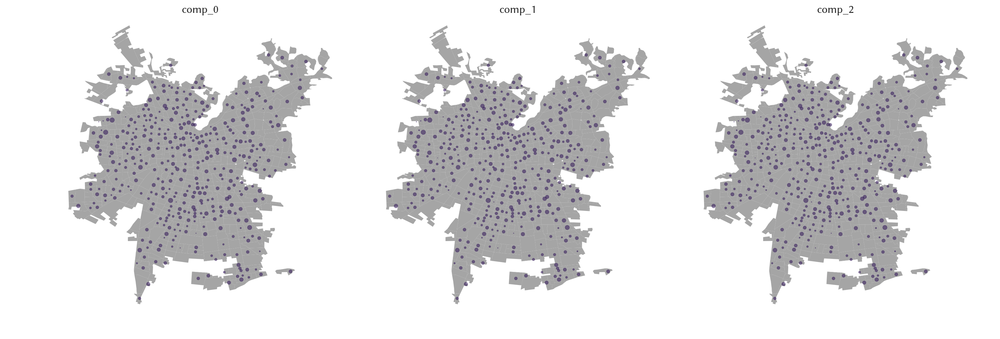

In [24]:
def plot_symbols_plain(**kwargs):
    ax = plt.gca()
    urban_zones.plot(ax=ax, facecolor='#a5a5a5', zorder=0)
    data = kwargs.pop('data')
    sizes = pd.Series(minmax_scale(data['value'], feature_range=(0, 160)),
                  index=data.index)
    
    ax.scatter(data.geometry.x, data.geometry.y, s=sizes, **kwargs)    
    plt.axis('off')
    plt.axis('equal')

g = sns.FacetGrid(data=zone_comps.reset_index(), col='variable', col_wrap=3, size=7, palette='magma')
g.map_dataframe(plot_symbols_plain, sizes=comp_sizes, alpha=0.5)
g.set_titles('{col_name}')
g.fig.tight_layout(pad=0)

In [25]:
zone_components.head()

,comp_0,comp_1,comp_2
Zona,,,
1,0.074514,0.086113,0.000000
2,0.182448,0.000000,0.000000
3,0.205076,0.000000,0.070155
4,0.195619,0.000000,0.000000
5,0.062751,0.064078,0.082592


In [26]:
zone_components.head().idxmax(axis=1)

Zona
1    comp_1
2    comp_0
3    comp_0
4    comp_0
5    comp_2
dtype: object

In [27]:
urban_zones['cluster'] = zone_components.idxmax(axis=1)

In [28]:
urban_zones.head()

,AREA,Zona,Com,Comuna,geometry,cluster
ID,,,,,,
103,837.7500,103.0,13105,El Bosque,POLYGON ((-70.65484700000178 -33.5543640000007...,comp_2
104,998.8125,104.0,13105,El Bosque,POLYGON ((-70.67890900000191 -33.5591080000008...,comp_1
106,286.2500,106.0,13105,El Bosque,POLYGON ((-70.67599200000191 -33.5554230000007...,NaN
115,857.4375,115.0,13105,El Bosque,POLYGON ((-70.67599200000191 -33.5554230000007...,comp_0
116,853.9375,116.0,13105,El Bosque,POLYGON ((-70.66819400000186 -33.5520660000007...,comp_0


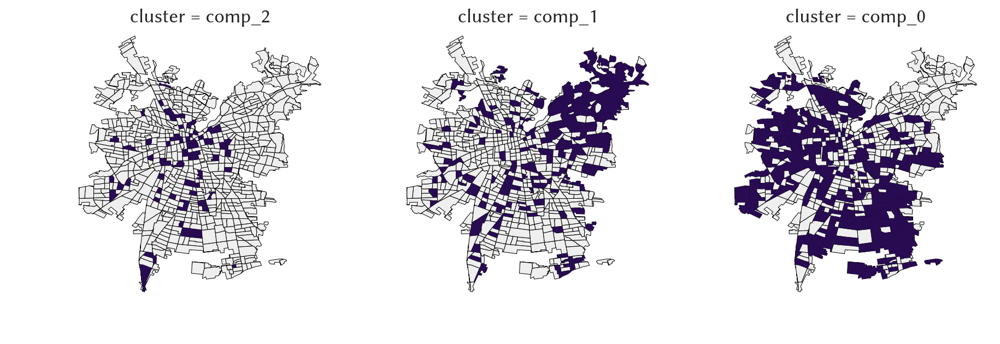

In [30]:
def plot_region(**kwargs):
    ax = plt.gca()
    geodf = kwargs.pop('data')
    color = kwargs.pop('color')
    
    urban_zones.plot(ax=ax, facecolor='#efefef', edgecolor='black')
    geodf.plot(ax=ax, **kwargs)
    
    plt.axis('equal')
    plt.axis('off')
    
g = sns.FacetGrid(data=urban_zones, col='cluster', col_wrap=3, sharex=False, sharey=False,
                 aspect=1, size=4)
g.map_dataframe(plot_region)
g.fig.tight_layout(pad=0)

## Kriging (Gaussian Process Regression)

In [36]:
municipality_features = pd.read_csv('municipality_features.csv', index_col='municipality').fillna(0)

In [31]:
tracts = gpd.read_file('./input/2012_zonas_censales/Zonas_Censales.shp', 
                       crs={'init': 'epsg:4326'})

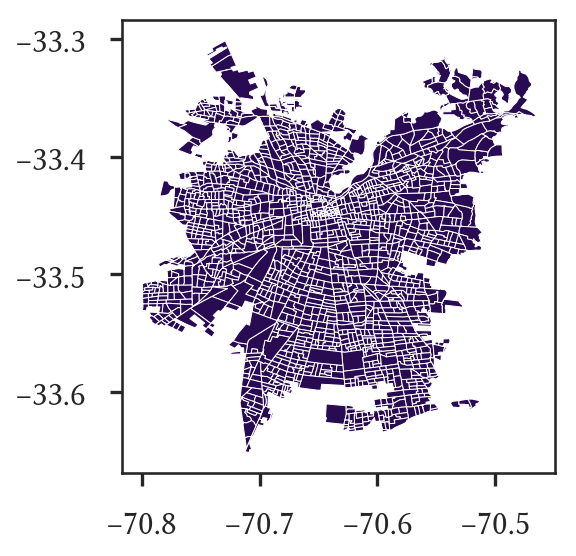

In [32]:
urban_tracts = (tracts.to_crs({'init': 'epsg:5361'})
               .assign(geometry=lambda df_: df_.geometry.map(urban_part))
               .pipe(lambda df_: df_[~df_.is_empty].copy())
               .to_crs({'init': 'epsg:4326'}))
urban_tracts.plot(edgecolor='white')

In [33]:
urban_tracts.head()

,REGION,PROVINCIA,COMUNA,COD_DISTRI,COD_ZONA,DESC_REGIO,DESC_PROVI,DESC_COMUN,URBANO,geometry
0,13,131,13121,2.0,1.0,REGIÓN METROPOLITANA DE SANTIAGO,SANTIAGO,PEDRO AGUIRRE CERDA,131211,POLYGON ((-70.65571416499996 -33.4785627869999...
1,13,131,13121,6.0,1.0,REGIÓN METROPOLITANA DE SANTIAGO,SANTIAGO,PEDRO AGUIRRE CERDA,131211,POLYGON ((-70.68182121699994 -33.4765392139999...
2,13,131,13121,1.0,1.0,REGIÓN METROPOLITANA DE SANTIAGO,SANTIAGO,PEDRO AGUIRRE CERDA,131211,POLYGON ((-70.67225825799994 -33.4855046939999...
3,13,131,13121,1.0,2.0,REGIÓN METROPOLITANA DE SANTIAGO,SANTIAGO,PEDRO AGUIRRE CERDA,131211,POLYGON ((-70.67537478399998 -33.4828198769999...
4,13,131,13121,2.0,2.0,REGIÓN METROPOLITANA DE SANTIAGO,SANTIAGO,PEDRO AGUIRRE CERDA,131211,POLYGON ((-70.66474927799999 -33.4786054799999...


In [34]:
name_map = dict(zip([13101, 13102, 13103
    ,13104,13105,13106,13107,13108,13109,13110,13111,13112,13113,13114,13115,13116,13117,13118,13119,13120,13121,13122,13123
    ,13124,13125,13126,13127,13128,13129,13130,13131,13132,13201,13202,13203,13301,13302,13303,13401,13402,13403,13404,13501,
                     13502, 13503, 13504, 13505, 13601, 13602, 13603, 13604, 13605],
        map(lambda x: x.title(), ['Santiago', 'Cerrillos', 'Cerro Navia', 'Conchalí',
        'El Bosque', 'Estación Central', 'Huechuraba', 'Independencia', 'La Cisterna',
        'La Florida', 'La Granja', 'La Pintana',
        'La Reina','Las Condes','Lo Barnechea','Lo Espejo', 'Lo Prado',
        'Macul','Maipú','Ñuñoa','Pedro Aguirre Cerda','Peñalolén',
        'Providencia','Pudahuel','Quilicura','Quinta Normal','Recoleta','Renca',
        'San Joaquín','San Miguel','San Ramón','Vitacura','Puente Alto','Pirque',
        'San José de Maipo','Colina','Lampa','Tiltil','San Bernardo','Buin',
        'Calera de Tango','Paine','Melipilla','Alhué','Curacaví','María Pinto','San Pedro',
        'Talagante','El Monte','Isla de Maipo','Padre Hurtado','Peñaflor'
        ])))

urban_tracts['municipality'] = urban_tracts.COMUNA.map(lambda x: name_map[int(x)])

In [37]:
urban_tracts = urban_tracts.join(municipality_features, on='municipality')
urban_tracts.head()

,REGION,PROVINCIA,COMUNA,COD_DISTRI,COD_ZONA,DESC_REGIO,DESC_PROVI,DESC_COMUN,URBANO,geometry,...,z_satisfaction,average_income,Auto,Bicicleta,Bip!,Bip! - Otros Privado,Bip! - Otros Público,Caminata,Taxi,Taxi Colectivo
0,13,131,13121,2.0,1.0,REGIÓN METROPOLITANA DE SANTIAGO,SANTIAGO,PEDRO AGUIRRE CERDA,131211,POLYGON ((-70.65571416499996 -33.4785627869999...,...,-2.052627,696279,0.18759,0.065174,0.571386,0.004447,0.036675,0.110551,0.008059,0.016118
1,13,131,13121,6.0,1.0,REGIÓN METROPOLITANA DE SANTIAGO,SANTIAGO,PEDRO AGUIRRE CERDA,131211,POLYGON ((-70.68182121699994 -33.4765392139999...,...,-2.052627,696279,0.18759,0.065174,0.571386,0.004447,0.036675,0.110551,0.008059,0.016118
2,13,131,13121,1.0,1.0,REGIÓN METROPOLITANA DE SANTIAGO,SANTIAGO,PEDRO AGUIRRE CERDA,131211,POLYGON ((-70.67225825799994 -33.4855046939999...,...,-2.052627,696279,0.18759,0.065174,0.571386,0.004447,0.036675,0.110551,0.008059,0.016118
3,13,131,13121,1.0,2.0,REGIÓN METROPOLITANA DE SANTIAGO,SANTIAGO,PEDRO AGUIRRE CERDA,131211,POLYGON ((-70.67537478399998 -33.4828198769999...,...,-2.052627,696279,0.18759,0.065174,0.571386,0.004447,0.036675,0.110551,0.008059,0.016118
4,13,131,13121,2.0,2.0,REGIÓN METROPOLITANA DE SANTIAGO,SANTIAGO,PEDRO AGUIRRE CERDA,131211,POLYGON ((-70.66474927799999 -33.4786054799999...,...,-2.052627,696279,0.18759,0.065174,0.571386,0.004447,0.036675,0.110551,0.008059,0.016118


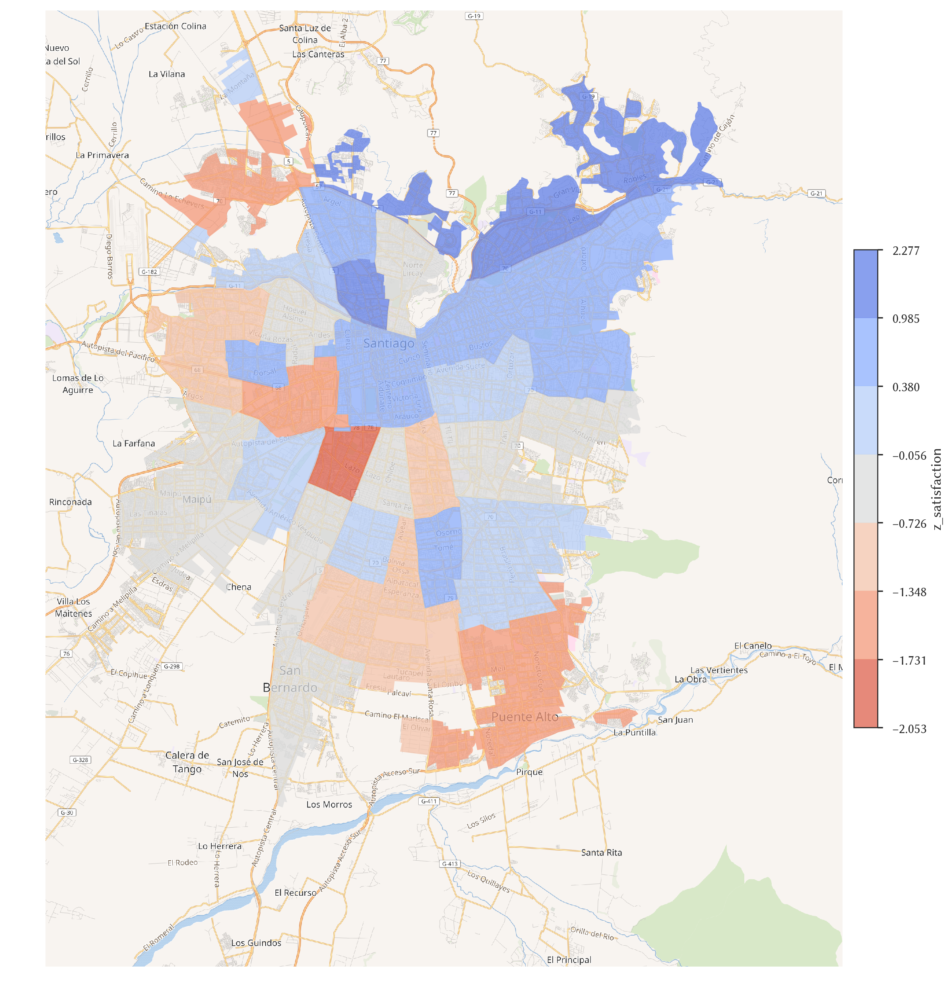

In [38]:
carpynter.choropleth(urban_tracts, scheme='fisher_jenks',
                     figsize=20, column='z_satisfaction', palette='coolwarm_r', n_colors=7)

In [39]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import WhiteKernel, ExpSineSquared

In [40]:
urban_tract_centroids = urban_tracts.centroid

In [41]:
urban_tract_centroids.head()

0    POINT (-70.66346937225769 -33.47734770168691)
1     POINT (-70.68410611339574 -33.4831561265016)
2    POINT (-70.67274854174629 -33.48149137272618)
3    POINT (-70.67822420152072 -33.48133880402625)
4    POINT (-70.66207412042249 -33.48021378970844)
dtype: object

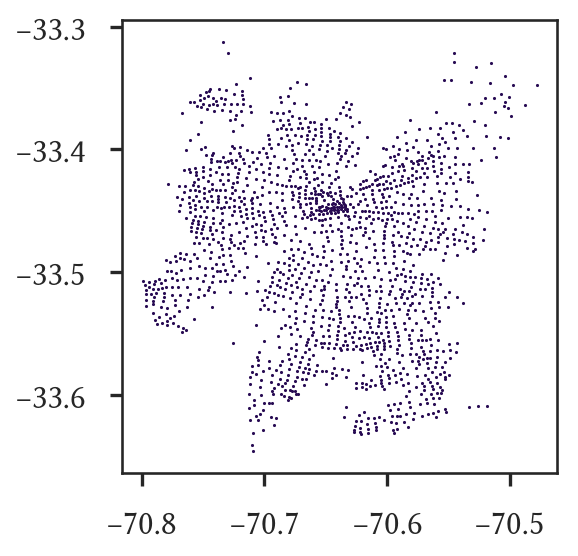

In [42]:
urban_tract_centroids.plot(markersize=1)

In [44]:
tract_data = pd.DataFrame(data={'lon': urban_tract_centroids.geometry.x, 
                                'lat': urban_tract_centroids.geometry.y, 
                                'value': urban_tracts.z_satisfaction})
tract_data.head()

,lat,lon,value
0,-33.477348,-70.663469,-2.052627
1,-33.483156,-70.684106,-2.052627
2,-33.481491,-70.672749,-2.052627
3,-33.481339,-70.678224,-2.052627
4,-33.480214,-70.662074,-2.052627


In [77]:
gp_kernel = ExpSineSquared(1.0, 5.0, periodicity_bounds=(1e-2, 1e1)) + WhiteKernel(0.05)

gp = GaussianProcessRegressor(kernel=gp_kernel, random_state=1)
gp.fit(tract_data.loc[:,('lon', 'lat')].values, tract_data.value.values)

GaussianProcessRegressor(alpha=1e-10, copy_X_train=True,
             kernel=ExpSineSquared(length_scale=1, periodicity=5) + WhiteKernel(noise_level=0.05),
             n_restarts_optimizer=0, normalize_y=False,
             optimizer='fmin_l_bfgs_b', random_state=1)

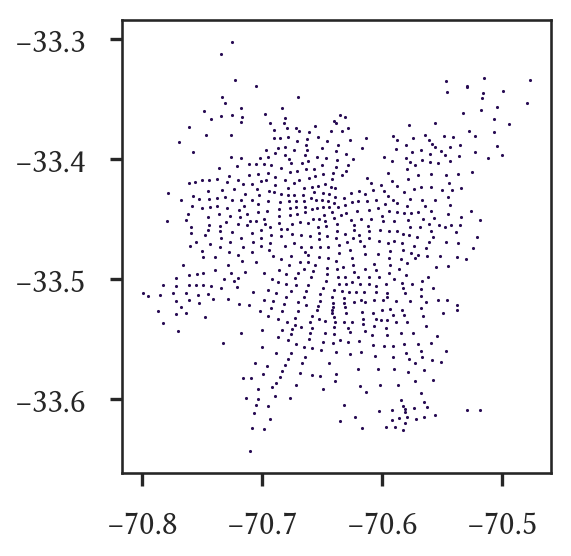

In [78]:
zone_centroids = urban_zones.centroid
zone_centroids.plot(markersize=1)

In [79]:
to_predict = np.hstack((zone_centroids.geometry.x.values.reshape(-1, 1), 
                        zone_centroids.geometry.y.values.reshape(-1, 1)))
to_predict

array([[-70.65850986, -33.55806091],
       [-70.67184772, -33.55424485],
       [-70.68875428, -33.56183959],
       ..., 
       [-70.50383952, -33.3896839 ],
       [-70.49422752, -33.37110434],
       [-70.50043866, -33.39702612]])

In [80]:
predicted = gp.predict(to_predict)
predicted

array([ -9.80045333e-01,  -1.10709342e+00,  -1.00914489e+00,
        -1.14969878e+00,  -1.11132293e+00,   1.40264154e-01,
         1.43569933e-01,   4.05678739e-02,   1.75206233e-01,
         1.95895933e-01,   4.79979808e-01,   2.90468524e-01,
        -4.21060683e-01,  -4.26488416e-01,  -3.33290655e-01,
        -2.88018298e-01,  -8.14945478e-01,  -7.73686115e-01,
        -1.83302247e+00,  -1.24055246e+00,  -5.40784703e-01,
        -5.27222586e-01,  -8.34499660e-01,  -7.34731184e-01,
        -1.66002807e+00,  -1.73158235e+00,  -7.91355155e-01,
        -7.69925241e-01,  -7.06320324e-01,  -8.39174300e-01,
        -7.17532833e-01,  -7.43555077e-01,  -7.85332523e-01,
        -7.28093572e-01,  -7.20509817e-01,  -7.21027570e-01,
        -7.32543544e-01,  -6.66980555e-01,  -7.28194837e-01,
        -7.29940478e-01,  -7.28304580e-01,  -7.10303578e-01,
        -7.19729352e-01,  -1.00391012e+00,  -1.00745595e+00,
        -9.64728104e-01,  -1.03962756e+00,  -7.30731654e-01,
        -6.99763509e-01,

In [81]:
urban_zones['gaussian_satisfaction'] = predicted

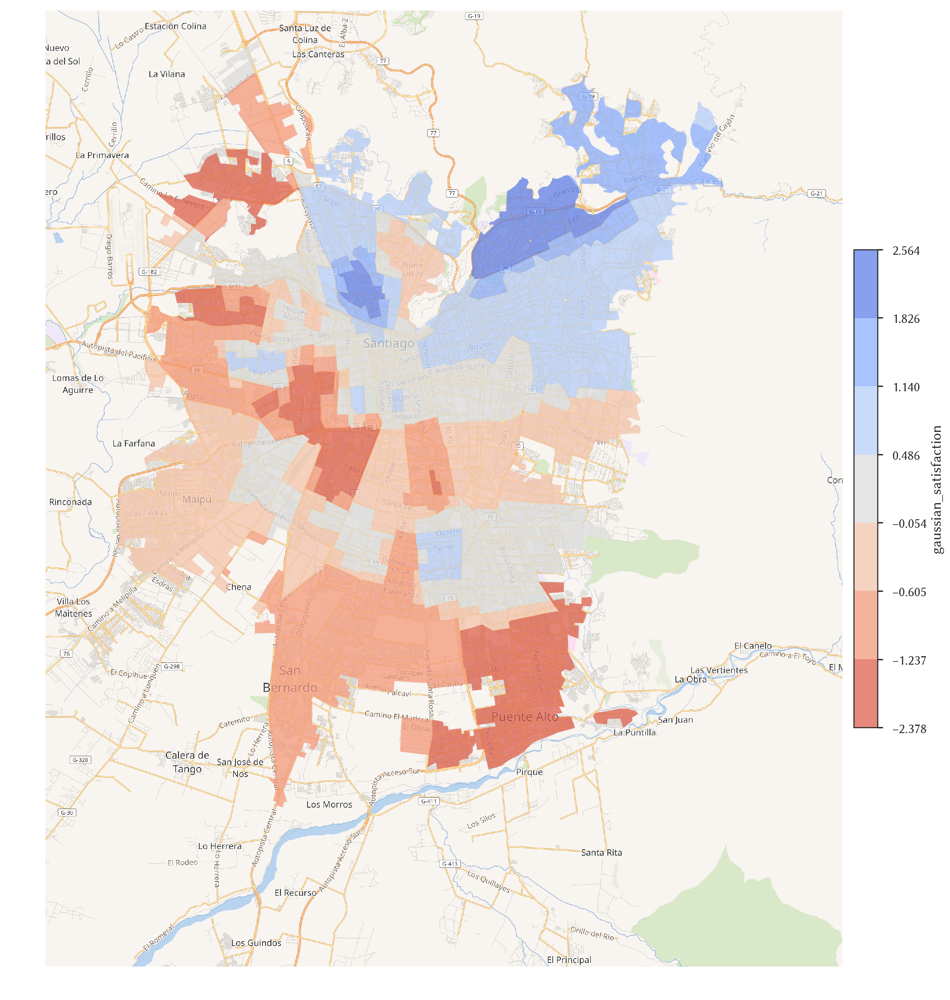

In [82]:
carpynter.choropleth(urban_zones, scheme='fisher_jenks',
                     figsize=20, column='gaussian_satisfaction', palette='coolwarm_r', n_colors=7)

In [83]:
urban_tracts['gaussian_satisfaction'] = gp.predict(tract_data.loc[:,('lon', 'lat')].values)

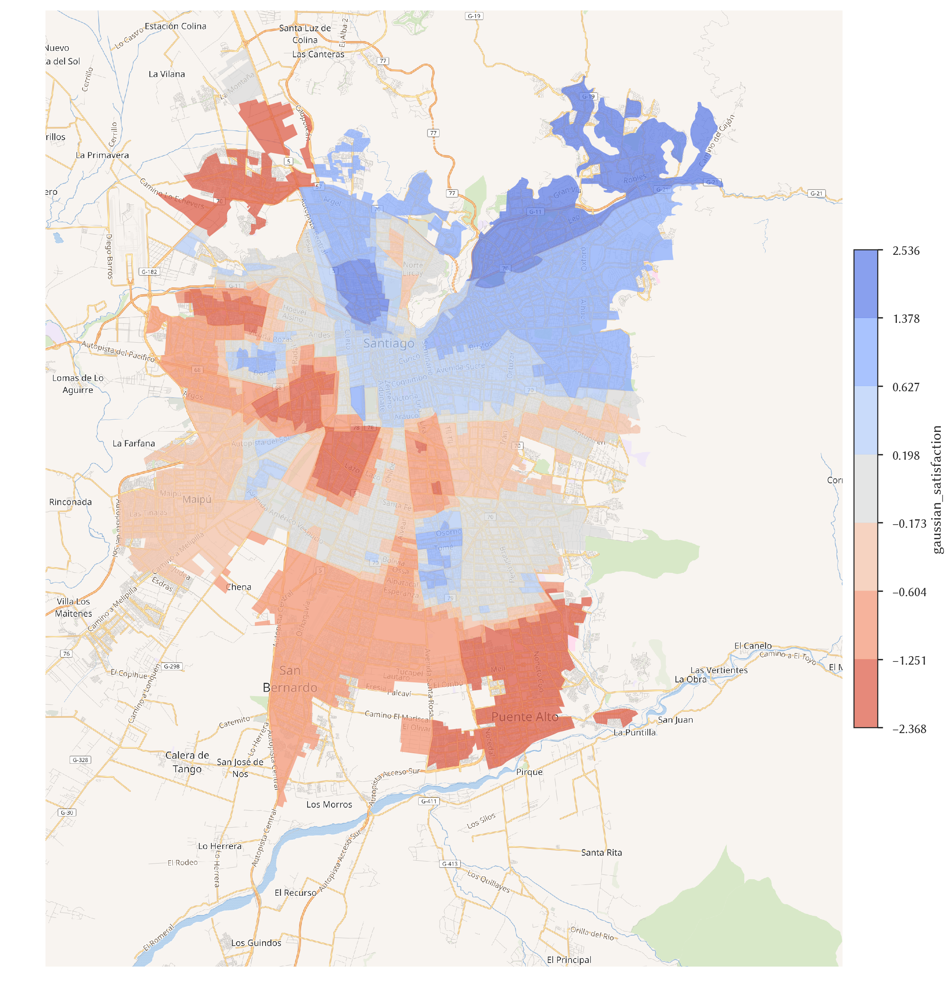

In [84]:
carpynter.choropleth(urban_tracts, scheme='fisher_jenks',
                     figsize=20, column='gaussian_satisfaction', palette='coolwarm_r', n_colors=7)